In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import networkx as nx


from sklearn.preprocessing import OneHotEncoder
from sklearn.impute import KNNImputer


In [2]:
sns.set_style("ticks")

In [3]:
# Load data

train = pd.read_csv('./data/train.csv')
greeks = pd.read_csv('./data/greeks.csv')
test = pd.read_csv('./data/test.csv')

In [4]:
# Set index

train = train.set_index('Id')
test = test.set_index('Id')
greeks = greeks.set_index('Id')

# Separate target and features
X = train.drop('Class', axis = 1)
y = train['Class']


<h3><center> Data Organization / Cleaning </center></h3>

In [5]:
# Get features list
violin_features = list(X.columns)
categorial_features = X.columns[X.dtypes != float].values.tolist()

# Remove non-float features
violin_features.remove(*categorial_features)

print(categorial_features)

['EJ']


One-hot encoding for 'EJ' categorial feature

In [6]:
# Encode categorial object 'EJ' feature 

enc = OneHotEncoder()
enc.fit(X['EJ'].values.reshape(-1, 1))
onehot_cols = ['EJ' + '_' + x for x in enc.categories_[0]]

X[onehot_cols] = enc.transform(X['EJ'].values.reshape(-1, 1)).toarray()
X = X.drop('EJ', axis = 1)

test[onehot_cols] = enc.transform(test['EJ'].values.reshape(-1, 1)).toarray()
test = test.drop('EJ', axis = 1)

Check and fill missing values using KNN Imputer

In [7]:
# Check which features are missing and how many missing data points are there

nas = X.isnull().sum()[X.isnull().sum() > 0]
nas

BQ    60
CB     2
CC     3
DU     1
EL    60
FC     1
FL     1
FS     2
GL     1
dtype: int64

In [8]:
# Since the features which contain missing values are not normally-distributed, we will use iterative imputer. 

imp = KNNImputer() # weight by distance but use many neighbors
X2 = pd.DataFrame(imp.fit_transform(X), index = X.index, columns = X.columns)

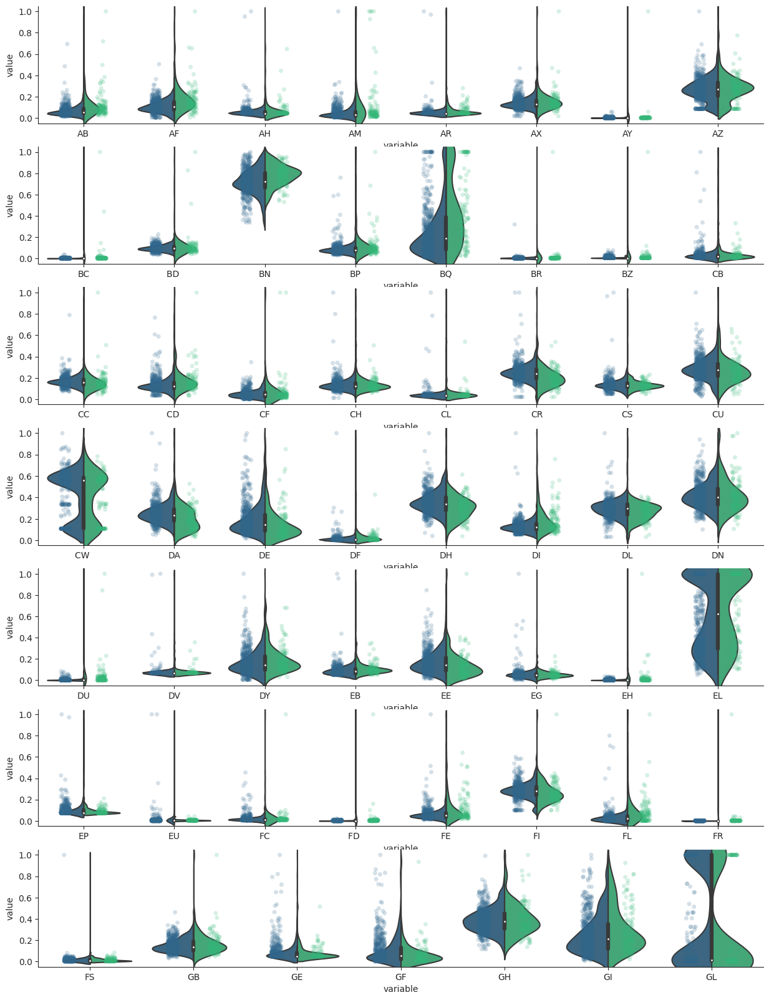

In [9]:
# Plot violin plots of non-categorial features

fig, axs = plt.subplots(nrows = 7, ncols = 1, figsize = (15, 20))

axs = np.ravel(axs)

for row in range(7):
    features = violin_features[row*8:(row+1)*8]
    #df_plot = pd.concat([X2[features], y], axis = 1)
    df_plot = pd.concat([X2[features], y], axis = 1)
    df_plot = df_plot / df_plot.max(axis = 0) # Normalize them for plotting purposes
    df_plot = df_plot.melt(id_vars = ['Class'], value_vars = features)
    sns.violinplot(data = df_plot, x = 'variable', y = 'value', hue = 'Class', split = True,palette = 'viridis', ax = axs[row])
    sns.stripplot(data = df_plot, x = 'variable', y = 'value', hue = 'Class', dodge = True,palette = 'viridis', alpha = 0.2, ax = axs[row])
    axs[row].get_legend().remove()
sns.despine()
#plt.tight_layout()

Semi-insights:
*Highly concentrated AY, BC, BR, BZ, DU, EH, EU, FR  <br>
* Large AM -> Highly likely Green <br>
* Large CR -> Slightly likely blue <br>
* Large DH -> Slightly likely blue <br>
* Large DA -> Slightly likely blue <br>
* Large EE -> Slightly likely blue <br>
* Large FI -> Slightly likely blue <br>
<br>

Before studying the correlations, let us complete the missing values.

In [11]:
df_corr = X2.corr().abs()
corr_pairs = df_corr.unstack().dropna().sort_values(ascending=False)
selected_corr_pairs = corr_pairs[(corr_pairs < 1) & (corr_pairs > 0.75)]
selected_corr_pairs = selected_corr_pairs.iloc[::2] # drop the identical 
selected_corr_pairs

EJ_B  EJ_A    1.000000
EJ_A  GL      0.978148
EJ_B  GL      0.978148
EH    FD      0.971152
DV    CL      0.948991
BZ    BC      0.907981
DU    EH      0.850953
AR    DV      0.823012
DU    FD      0.805990
EP    CS      0.794158
      AR      0.754615
BC    BD      0.753051
dtype: float64

Spaces?

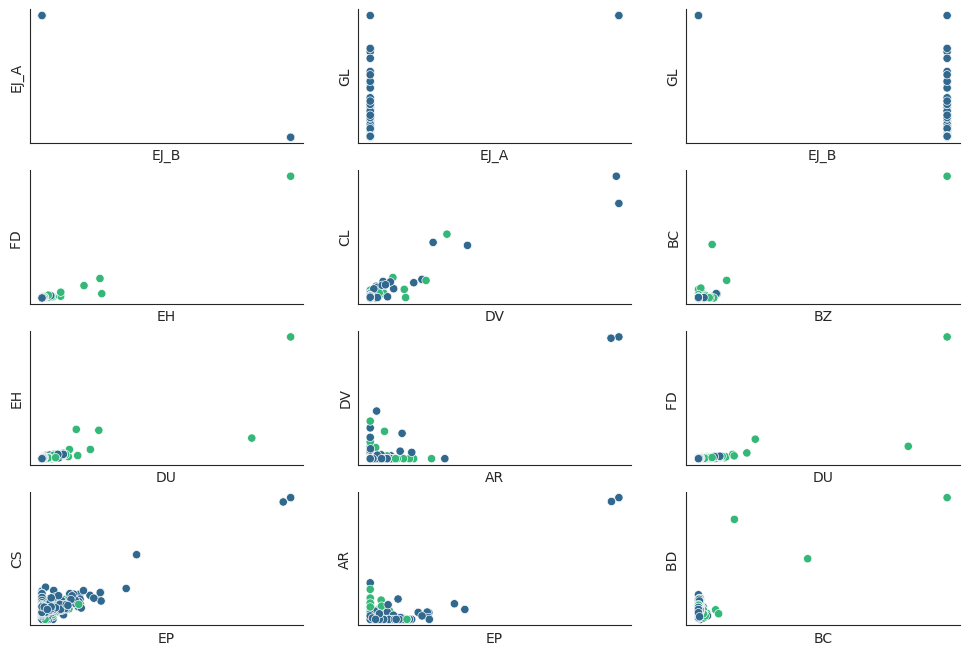

In [12]:
# Plot calibration plots of highly correlated categorial features

fig, axs = plt.subplots(nrows = 4, ncols = 3, figsize = (12, 8))

axs = np.ravel(axs)

for i, pair in enumerate(selected_corr_pairs.index):
    f1, f2 = pair
    sns.scatterplot(data = pd.concat([X2[[f1, f2]], y], axis = 1), x = f1, y = f2, hue = 'Class', ax = axs[i], palette='viridis')
    #sns.regplot(data = train[[f1, f2, 'Class']], x = f1, y = f2, ax = axs[i])

    axs[i].get_legend().remove()
    axs[i].set_xticks([])
    axs[i].set_yticks([])
sns.despine()


In [13]:
df_categorial = train[['GL', 'EJ', 'Class']]


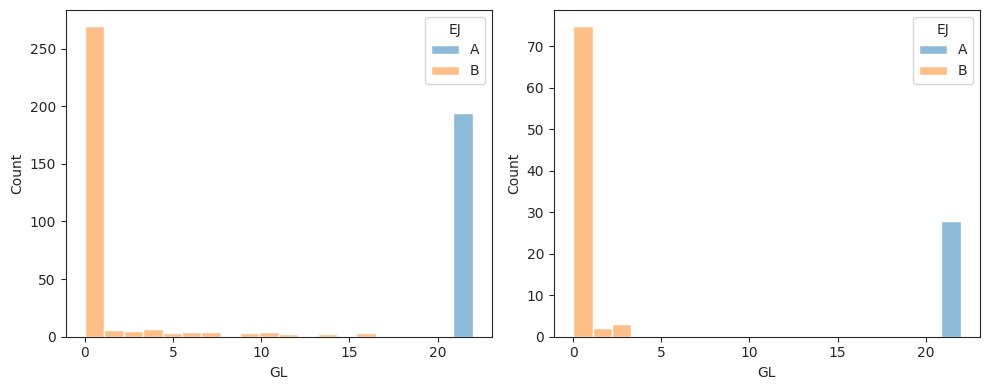

In [14]:
fig, ax = plt.subplots(ncols = 2, nrows = 1, figsize = (10, 4))
sns.histplot(data = train[train['Class'] == 0], x = 'GL', hue = 'EJ', ax = ax[0], hue_order = ['A', 'B'], bins = 20)
sns.histplot(data = train[train['Class'] == 1], x = 'GL', hue = 'EJ', ax = ax[1], hue_order = ['A', 'B'], bins = 20)
plt.tight_layout()

In [15]:
print('Value count with GL over 18\n',train.loc[train['GL'] >= 18, "EJ"].value_counts())
print('Value count with GL under 18\n',train.loc[train['GL'] < 18, "EJ"].value_counts())

Value count with GL over 18
 EJ
A    222
B      1
Name: count, dtype: int64
Value count with GL under 18
 EJ
B    393
Name: count, dtype: int64


In [16]:
print('The single value with B ('+train.loc[(train['GL'] > 18) & (train['EJ'] == 'B')].index[0]+') is not the same as the missing value in GL ('+X['GL'][X['GL'].isnull()].index[0]+')')

The single value with B (38325b0c36e5) is not the same as the missing value in GL (f46e39a96ee9)


Thus, smaller GL will be always in Class B, and larger A will always be in class A. 
<br>
Let us map the correlated features in a network.

In [17]:
selected_corr_pairs = corr_pairs[(corr_pairs < 1) & (corr_pairs > 0.6)]
selected_corr_pairs = selected_corr_pairs.iloc[::2] # drop the identical 
selected_corr_pairs
G = nx.DiGraph(selected_corr_pairs.index.to_list())

In [18]:
def generate_points_on_circle(nodes, radius=1):
    points = {}
    num_points = len(nodes)
    for i in range(num_points):
        angle = 2 * np.pi * i / num_points
        x = radius * np.cos(angle)
        y = radius * np.sin(angle)
        points[nodes[i]] = (x, y)
    return points

# Generate 15 points on the circle with radius 1
points_on_circle = generate_points_on_circle(list(list(G.nodes())))


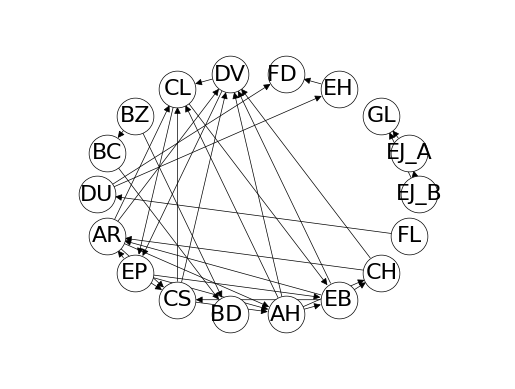

In [19]:
params = {
    "font_size": 16,
    "node_size": 700,
    "node_color": "white",
    "edgecolors": "black",
    "linewidths": 0.5,
    "width": 0.5,
}
nx.draw_networkx(G, points_on_circle, **params)
ax = plt.gca()
ax.margins(0.2)
plt.axis("off")
plt.show()

In [20]:
# Add clusters

<h3><center> Dimensionality Reduction </center></h3>

In [21]:
from sklearn.decomposition import PCA

Let us try PCA.


In [22]:
pca = PCA(n_components=3)
X2_reduced = pd.DataFrame(pca.fit_transform(X2 / X2.max()), index = X2.index) # PCA on scaled data
X2_reduced = X2_reduced / X2_reduced.max()
print('The 3 PCA components explain {:.2f}%, {:.2f}% ,and {:.2f}%, respectievly.'.format(*100*pca.explained_variance_ratio_))


The 3 PCA components explain 54.40%, 8.40% ,and 5.68%, respectievly.


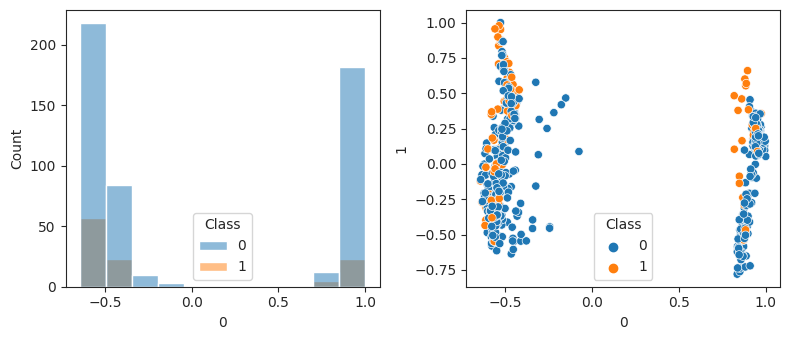

In [23]:
fig, axs = plt.subplots(ncols = 2, nrows = 1, figsize = (8, 3.5))

sns.histplot(data = pd.concat([X2_reduced, y], axis = 1), x = 0, hue = 'Class', ax = axs[0])
sns.scatterplot(data = pd.concat([X2_reduced, y], axis = 1), x = 0, y = 1, hue = 'Class', ax = axs[1])
plt.tight_layout()

Text(0.5, 0, '2')

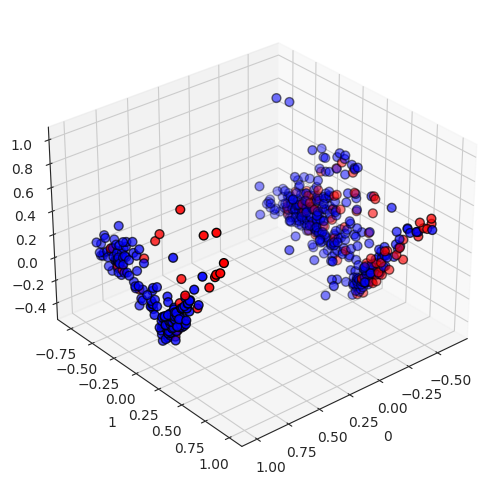

In [24]:
fig = plt.figure(1, figsize=(8, 6))
ax = fig.add_subplot(projection="3d", elev=30, azim=50)
ax.scatter(
    X2_reduced[0],
    X2_reduced[1],
    X2_reduced[2],
    c=y,
    cmap='bwr',
    edgecolor="k",
    s=40,
)
ax.set_xlabel('0')
ax.set_ylabel('1')
ax.set_zlabel('2')

* The first component can clearly cluster the data to two clusters. 
* The distribution is not related to the class itslef.
* The second component does not help to further cluster the data. The third is even less useful.<br>

These observations are in line with the relatively high explained variance ratio of the first component compared to the second one. <br>
Let us examine the components.

In [25]:
pca_importance = pd.DataFrame(pca.components_[0,:], index = X2.columns, columns = ['Importance']).abs().sort_values(ascending=False, by = "Importance").reset_index()
pca_importance = pca_importance.rename({'index':'Features'}, axis = 1)

In [26]:
pca_importance['Importance cumsum'] = pca_importance['Importance'].cumsum()

<Axes: xlabel='Features', ylabel='Importance cumsum'>

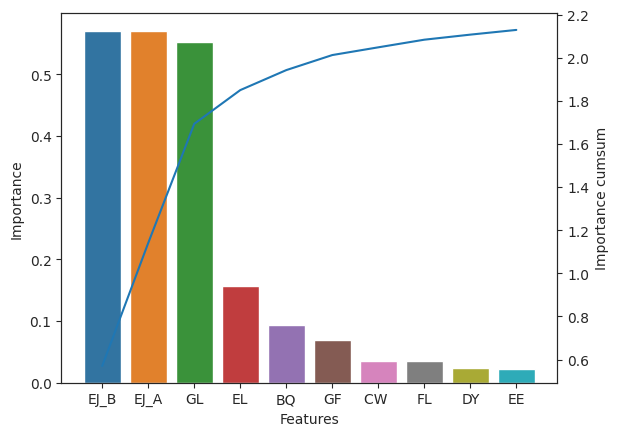

In [27]:
ax = sns.barplot(data = pca_importance[0:10], y = 'Importance', x = 'Features')
ax2 = ax.twinx()
sns.lineplot(data = pca_importance[0:10], y = 'Importance cumsum', x = 'Features', ax = ax2)

<h3><center> Baseline Models </center></h3>

In [28]:
from sklearn.ensemble import GradientBoostingClassifier, RandomForestClassifier
import lightgbm as lgb
import xgboost as xgb
from sklearn.model_selection import RandomizedSearchCV
from sklearn.model_selection import StratifiedKFold
from sklearn.preprocessing import StandardScaler
from sklearn.utils.class_weight import compute_sample_weight, compute_class_weight
from sklearn.metrics import f1_score, accuracy_score


In [29]:
def balanced_logloss(y, p):
    '''
    Calculation of balance logloss according to the competition metric.
    Input:
        y   -   Real target
        p   -   Predicted probabilities
    Output:
        L   -   Balanced logloss
    '''
    # Clip the propabilities to avoid function extremes
    p = np.clip(p, 1e-15, 1-1e-15) 

    # Count targets
    N_0 = y[y == 0].shape[0] 
    N_1 = y[y == 1].shape[0]
    
    # Arrays of ones for samples which belong to each target 0 
    y0 = np.zeros_like(y) 
    y0[y == 0] = 1
    y1 = np.zeros_like(y) 
    y1[y == 1] = 1

    # Probability array for each target
    p0 = p[:,0] 
    p1 = p[:,1] 

    # logloss of target, normalized to the number of samples for each target
    logloss_0 = -np.sum(y0*np.log(p0))/(N_0+1e-15) 
    logloss_1 = -np.sum(y1*np.log(p1))/(N_1+1e-15) 

    L = (logloss_0 + logloss_1)/2

    return L
    
# test
# y_tmp = np.array([0, 0, 0, 0, 0])
# p_tmp = np.array([[0.91, 0.09], # 0
#                  [0.89, 0.11], # 0
#                  [0.07, 0.93], # 1
#                  [0.02, 0.98], # 1
#                  [0.84, 0.16]]) # 0
# balanced_logloss(y_tmp, p_tmp)

In [30]:
def preprocess(X_train, X_test, y_train): # 
    '''
    A function which imputes (knn), scales (standard scaler), and calculate class weights.
    Input: 
        X_train   -   Training X dataset (df).
        X_test    -   Testing X dataset (df).
        y_train   -   Training target (df) for weighting purposes. 
    Output:
        X_train   -   Scaled and imputed training X dataset (df).
        X_test    -   Scaled and imputed testing X dataset (df).
        sw        -   Samples weight based on the training target. 
    '''
    # Add missing values using KNN Imputer
    imp = KNNImputer(weights = 'distance', n_neighbors=20).fit(X_train)

    X_train = pd.DataFrame(imp.transform(X_train), index = X_train.index, columns = X_train.columns)
    X_test = pd.DataFrame(imp.transform(X_test), index = X_test.index, columns = X_test.columns)

    # Scale data using Standard Scaler
    scaler = StandardScaler().fit(X_train)

    X_train = pd.DataFrame(scaler.transform(X_train), index = X_train.index, columns = X_train.columns)
    X_test = pd.DataFrame(scaler.transform(X_test), index = X_test.index, columns = X_test.columns)

    # Class and sample weights
    cw = compute_class_weight(class_weight = "balanced", classes = np.unique(y_train), y = y_train)
    cw = dict(zip(np.unique(y_train), cw))
    sw = compute_sample_weight(cw, y_train)

    return X_train, X_test, imp, scaler, sw, cw

In [31]:
def pred_score_store(i, X_train, y_train, X_test, y_test, models, models_names):
    '''
    A function which predicts, scores predictions, and calculate scores for the different models.
    The function treats a single split.
    Inputs:
        i              -   Split number (int)
        X_train        -   Training X dataset (df).
        X_test         -   Testing X dataset (df).
        y_train        -   Training target (df). 
        y_test         -   Testing target (df). 
        models         -   Trained models to be evaluated (string)
        models_names   -   Trained models to be evaluated
    Outputs:
        score          -   Scores 
        y_hats         -   Predictions
        ps             -   Predicted probabilities
    '''
    score, y_hats, ps = {}, {}, {}

    # Iterate over models, store their predictions, probabilities and scores
    for model, model_name in zip(models, models_names):
        model_train_name = (model_name, 'train', str(i)) 
        model_test_name = (model_name, 'test', str(i))

        # Store predicted probabilities
        ps[model_train_name] = model.predict_proba(X_train) 
        ps[model_test_name] = model.predict_proba(X_test)

        # Store predicted targets
        y_hats[model_train_name] = model.predict(X_train) 
        y_hats[model_test_name] =  model.predict(X_test)

        # Calculate scores
        score[(model_name,str(i))] = [balanced_logloss(y_test, ps[model_test_name]),  
                                      balanced_logloss(y_train, ps[model_train_name]),
                                      f1_score(y_test, y_hats[model_test_name]), 
                                      f1_score(y_train, y_hats[model_train_name]),
                                      accuracy_score(y_test, y_hats[model_test_name]), 
                                      accuracy_score(y_train, y_hats[model_train_name])] 

    
    return score, y_hats, ps

In [32]:
def split_train(X_in, y_in, random_state):
    
    
    skf = StratifiedKFold(n_splits=5, random_state=random_state, shuffle=True)

    scores = {}

    for i, (train_index, test_index) in enumerate(skf.split(X_in, y_in)):  
        # Split
        X_train, X_test = X_in.iloc[train_index, :], X.iloc[test_index, :]
        y_train, y_test = y_in.iloc[train_index], y.iloc[test_index]

        X_train, X_test, imp, scaler, sw, cw = preprocess(X_train, X_test, y_train)

        # RF
        rf = RandomForestClassifier(criterion = 'log_loss')
        rf.fit(X_train, y_train, sample_weight=sw)

        # GB
        gb = GradientBoostingClassifier(loss = 'log_loss')
        gb.fit(X_train, y_train, sample_weight=sw)

        # xgboost
        xgb_clf = xgb.XGBClassifier(n_jobs = 28)
        xgb_clf.fit(X_train, y_train, sample_weight=sw)

        # Predict, score and store
        score_split, y_hats, ps = pred_score_store(i, X_train, y_train, X_test, y_test, [rf, gb, xgb_clf], ['rf', 'gb', 'xgb'])
        scores = {**scores, **score_split}

    scores_cols= ['balanced_logloss','balanced_logloss_train',
                  'f1_score','f1_score_train',
                  'accuracy_score','accuracy_score_train']
    df_scores = pd.DataFrame(scores, index = scores_cols).T.sort_index()
    
    return(df_scores, y_hats, ps)

In [33]:
scores = []
for split in [42]:#[0, 1, 2, 7, 13, 25, 42, 67, 73]:
    score, y_hats, ps = split_train(X, y, split)
    scores.append(score)

In [34]:
df_scores = pd.concat(scores).reset_index().groupby('level_0').describe().loc[:,(slice(None),['count','mean','std'])]
df_scores

balanced_logloss                     balanced_logloss_train            \
                   count      mean       std                  count      mean   
level_0                                                                         
gb                   5.0  0.365612  0.155421                    5.0  0.017538   
rf                   5.0  0.466746  0.049322                    5.0  0.127016   
xgb                  5.0  0.410585  0.189195                    5.0  0.006160   

                  f1_score                     f1_score_train            \
              std    count      mean       std          count mean  std   
level_0                                                                   
gb       0.000819      5.0  0.740232  0.089551            5.0  1.0  0.0   
rf       0.004148      5.0  0.676351  0.048434            5.0  1.0  0.0   
xgb      0.000121      5.0  0.775551  0.079358            5.0  1.0  0.0   

        accuracy_score                     accuracy_score_train            
                 count      mean       std                count mean  std  
level_0                                                                    
gb                 5.0  0.909205  0.027318                  5.0  1.0  0.0  
rf                 5.0  0.909258  0.010365                  5.0  1.0  0.0  
xgb                5.0  0.923761  0.028079                  5.0  1.0  0.0

<h3><center> Models Optimization using Optuna  </center></h3>

The models hyperparameters were optimized using Optuna. The optimized hyperparameters for each model will be used now for fitting and prediction. 

In [35]:
import optuna
from sklearn.model_selection import cross_val_score, cross_validate
from sklearn.metrics import confusion_matrix

In [36]:
def optuna_balanced_logloss(clf, X, y):
    '''
    Calculation of balance logloss according to the competition metric.
    Input:
        y   -   Real target
        p   -   Predicted probabilities
    Output:
        L   -   Balanced logloss
    '''
    # Calculate p
    p = clf.predict_proba(X)

    # Clip the propabilities to avoid function extremes
    p = np.clip(p, 1e-15, 1-1e-15) 

    # Count targets
    N_0 = y[y == 0].shape[0] 
    N_1 = y[y == 1].shape[0]
    
    # Arrays of ones for samples which belong to each target 0 
    y0 = np.zeros_like(y) 
    y0[y == 0] = 1
    y1 = np.zeros_like(y) 
    y1[y == 1] = 1

    # Probability array for each target
    p0 = p[:,0] 
    p1 = p[:,1] 

    # logloss of target, normalized to the number of samples for each target
    logloss_0 = -np.sum(y0*np.log(p0))/(N_0+1e-15) 
    logloss_1 = -np.sum(y1*np.log(p1))/(N_1+1e-15) 

    L = (logloss_0 + logloss_1)/2

    return L
    
# test
# y_tmp = np.array([0, 0, 0, 0, 0])
# p_tmp = np.array([[0.91, 0.09], # 0
#                  [0.89, 0.11], # 0
#                  [0.07, 0.93], # 1
#                  [0.02, 0.98], # 1
#                  [0.84, 0.16]]) # 0
# balanced_logloss(y_tmp, p_tmp)

In [37]:
opt_params = {
    "xgb0": {
        "max_depth": 6,
        "learning_rate": 0.009522659792716149,
        "eta": 0.1227628865615712,
        "lambda": 0.00879138982693735,
        "gamma": 0.08079334969765214,
        "alpha": 0.036061885141733224,
        "min_child_weight": 2,
        "grow_policy": "depthwise",
        "eval_metric": "logloss",
        "n_jobs": -1,
        "verbosity": 0,
        "verbose_eval": False,
        "objective": "binary:logistic",
        "booster": "gbtree",
        "early_stopping_rounds": 20,
    },
    "rf": {
        "criterion": "log_loss",
        "n_estimators": 97,
        "max_depth": 205,
        "min_samples_split": 21,
        "min_samples_leaf": 7,
    },
    "xgb1": {
        "max_depth": 6,
        "learning_rate": 0.00832957465964484,
        "eta": 0.09004423274684319,
        "lambda": 0.05691488668594993,
        "gamma": 0.177627930192174,
        "alpha": 0.05506089022859598,
        "min_child_weight": 1,
        "grow_policy": "depthwise",
        "eval_metric": "logloss",
        "n_jobs": -1,
        "verbosity": 0,
        "verbose_eval": False,
        "objective": "binary:logistic",
        "booster": "gbtree",
        "early_stopping_rounds": 20,
    },
    "gb": {
        "n_estimators": 2584,
        "max_depth": 3,
        "learning_rate": 0.008398545297915372,
        "subsample": 0.644,
        "max_features": "sqrt",
    },
    "xgb2": {
        "max_depth": 6,
        "learning_rate": 0.006637912692893284,
        "eta": 0.0941876058725554,
        "lambda": 0.12965944355119616,
        "gamma": 0.12212391496683248,
        "alpha": 0.08347842865598006,
        "min_child_weight": 2,
        "grow_policy": "lossguide",
        "eval_metric": "logloss",
        "n_jobs": -1,
        "verbosity": 0,
        "verbose_eval": False,
        "objective": "binary:logistic",
        "booster": "gbtree",
        "early_stopping_rounds": 20,
    },
    "xgb3": {
        "max_depth": 6,
        "learning_rate": 0.006008641066077624,
        "eta": 0.04115096188817993,
        "lambda": 0.0222814478962045,
        "gamma": 0.025738224242655813,
        "alpha": 0.0750069068184423,
        "min_child_weight": 2,
        "grow_policy": "lossguide",
        "eval_metric": "logloss",
        "n_jobs": -1,
        "verbosity": 0,
        "verbose_eval": False,
        "objective": "binary:logistic",
        "booster": "gbtree",
        "early_stopping_rounds": 20,
    },
    "xgb4": {
        "max_depth": 6,
        "learning_rate": 0.006520532724099332,
        "eta": 0.08002099390995251,
        "lambda": 0.09598561569096153,
        "gamma": 0.0386298900371538,
        "alpha": 0.02155309348509482,
        "min_child_weight": 3,
        "grow_policy": "depthwise",
        "eval_metric": "logloss",
        "n_jobs": -1,
        "verbosity": 0,
        "verbose_eval": False,
        "objective": "binary:logistic",
        "booster": "gbtree",
        "early_stopping_rounds": 20,
    },
}


In [38]:
def split_train(X_in, y_in, X_test, random_state):

    skf = StratifiedKFold(n_splits=5, random_state=random_state, shuffle=True)

    scores = {}
    ps_test = {}
    for i, (train_index, val_index) in enumerate(skf.split(X_in, y_in)):
        # Split
        X_train, X_val = X_in.iloc[train_index, :], X_in.iloc[val_index, :]
        y_train, y_val = y_in.iloc[train_index], y_in.iloc[val_index]

        X_train, X_val, imp, scaler, sw, cw = preprocess(X_train, X_val, y_train)
        cw = cw[0] / cw[1]
        # Add missing values using KNN Imputer
        X_test = pd.DataFrame(imp.transform(X_test), index = X_test.index, columns = X_test.columns)
        # Scale data using Standard Scaler
        X_test = pd.DataFrame(scaler.transform(X_test), index = X_test.index, columns = X_test.columns)

        # Fit xgb0
        xgb0_clf = xgb.XGBClassifier(
            **{
                  **opt_params["xgb0"],
                  **{"random_state": random_state, "scale_pos_weight": cw},
              }
        )

        xgb0_clf.fit(X_train, 
                        y_train, 
                        eval_set = [(X_val, y_val)], 
                        verbose=False,
                        sample_weight=sw)


        # Fit xgb1
        xgb1_clf = xgb.XGBClassifier(
            **{
                  **opt_params["xgb1"],
                  **{"n_estimators": 300, "random_state": random_state, "scale_pos_weight": cw},
              }
        )

        xgb1_clf.fit(X_train, 
                        y_train, 
                        eval_set = [(X_val, y_val)], 
                        verbose=False,
                        sample_weight=sw)


        # Fit xgb2
        xgb2_clf = xgb.XGBClassifier(
            **{
                  **opt_params["xgb2"],
                  **{"n_estimators": 600, "random_state": random_state, "scale_pos_weight": cw},
              }
        )

        xgb2_clf.fit(X_train, 
                        y_train, 
                        eval_set = [(X_val, y_val)], 
                        verbose=False,
                        sample_weight=sw)

        # Fit xgb3
        xgb3_clf = xgb.XGBClassifier(
            **{
                  **opt_params["xgb3"],
                  **{"n_estimators": 900, "random_state": random_state, "scale_pos_weight": cw},
              }
        )

        xgb3_clf.fit(X_train, 
                        y_train, 
                        eval_set = [(X_val, y_val)], 
                        verbose=False,
                        sample_weight=sw)

        # Fit RF
        rf_clf = RandomForestClassifier(
            **{
                  **opt_params["rf"],
                  **{"random_state": random_state},
              }
        )

        rf_clf.fit(X_train, 
                        y_train, 
                        sample_weight=sw)

        # Fit GB
        gb_clf = GradientBoostingClassifier(
            **{
                  **opt_params["gb"],
                  **{"random_state": random_state},
              }
        )

        gb_clf.fit(X_train, 
                        y_train, 
                        sample_weight=sw)

        p_val_xgb0 = xgb0_clf.predict_proba(X_val)
        p_val_xgb1 = xgb1_clf.predict_proba(X_val)
        p_val_xgb2 = xgb2_clf.predict_proba(X_val)
        p_val_xgb3 = xgb3_clf.predict_proba(X_val)
        p_val_rf = rf_clf.predict_proba(X_val)
        p_val_gb = gb_clf.predict_proba(X_val)

        p_test_xgb0 = xgb0_clf.predict_proba(X_test)
        p_test_xgb1 = xgb1_clf.predict_proba(X_test)
        p_test_xgb2 = xgb2_clf.predict_proba(X_test)
        p_test_xgb3 = xgb3_clf.predict_proba(X_test)
        p_test_rf = rf_clf.predict_proba(X_test)
        p_test_gb = gb_clf.predict_proba(X_test)

        p_val = (0.75*(p_val_xgb0 + p_val_xgb1 + p_val_xgb2 + p_val_xgb3) + 0.05*p_val_rf + 0.15*p_val_gb) / 6
        p_val = p_val / np.sum(p_val, axis = 1)[:,None]
        score_val = balanced_logloss(y_val, p_val)

        p_test = (0.75*(p_test_xgb0 + p_test_xgb1 + p_test_xgb2 + p_test_xgb3) + 0.05*p_test_rf + 0.15*p_test_gb) / 6
        p_test = p_test / np.sum(p_test, axis = 1)[:,None]


        ps_test[i] = p_test
        scores[i] = score_val

        
    return(scores, ps_test)

In [39]:
# %%
scores_all = {}
ps_test_all = {}

for split in [0, 13, 25, 42, 67]:
    scores_all[split], ps_test_all[split] =  split_train(X, y, test, split)

In [40]:
ps_all = np.array([ps_test_all[x][y] for x in ps_test_all for y in ps_test_all[x]])
ps = ps_all.mean(axis = 0)
df_sub = pd.DataFrame(ps, index = test.index, columns = ['class_0','class_1']).reset_index()

In [41]:
df_sub

,Id,class_0,class_1
0,00eed32682bb,0.73929,0.26071
1,010ebe33f668,0.73929,0.26071
2,02fa521e1838,0.73929,0.26071
3,040e15f562a2,0.73929,0.26071
4,046e85c7cc7f,0.73929,0.26071
